<a href="https://colab.research.google.com/github/mutturajiu/BA05-TRIM02-Module-04-Text-Analytics-/blob/master/Text_Analytics_100819.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [11]:
!pip install nltk

# Import pandas

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn import metrics
%matplotlib inline
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV
import string
import warnings 
warnings.filterwarnings("ignore", category=DeprecationWarning)
import re
from sklearn.feature_extraction.text import TfidfVectorizer 

Loading Data

In [0]:
data=pd.read_csv('TweetSent.csv')

Data Understanding

In [109]:
data.head()

,Tweet,Category
0,Not Available,negative
1,IOS 9 App Transport Security. Mm need to check...,neutral
2,"Mar if you have an iOS device, you should down...",neutral
3,@jimmie_vanagon my phone does not run on lates...,negative
4,Not sure how to start your publication on iOS?...,positive


In [110]:
data.Category.value_counts()

positive    2888
neutral     2123
negative     956
Tweet          1
Name: Category, dtype: int64

In [0]:
data['Tweet'] = data['Tweet'].str.replace('\d+', '')
data['Tweet'] = data['Tweet'].str.replace('[^\w\s]','')

In [112]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5968 entries, 0 to 5967
Data columns (total 2 columns):
Tweet       5968 non-null object
Category    5968 non-null object
dtypes: object(2)
memory usage: 93.3+ KB


<BarContainer object of 4 artists>

Text(0.5, 0, 'Review Sentiments')

Text(0, 0.5, 'Number of Review')

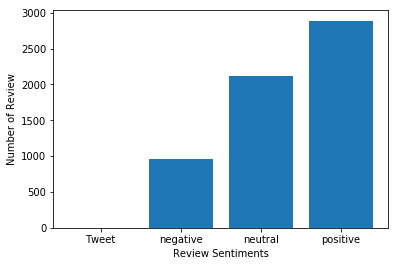

In [113]:
Sentiment_count=data.groupby('Category').count()
plt.bar(Sentiment_count.index.values, Sentiment_count['Tweet'])
plt.xlabel('Review Sentiments')
plt.ylabel('Number of Review')
plt.show()

In [0]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity="all"

In [115]:
#converting Category from (neutral, positive, negative) to (2, 3,1)
le = preprocessing.LabelEncoder()
le.fit(data['Category'])
list(le.classes_)
dfn = le.transform(data['Category'])
le.inverse_transform([2, 3, 1])
data['Sentiment']=dfn
data.head()

LabelEncoder()

['Tweet', 'negative', 'neutral', 'positive']

array(['neutral', 'positive', 'negative'], dtype=object)

,Tweet,Category,Sentiment
0,Not Available,negative,1
1,IOS App Transport Security Mm need to check i...,neutral,2
2,Mar if you have an iOS device you should downl...,neutral,2
3,jimmie_vanagon my phone does not run on latest...,negative,1
4,Not sure how to start your publication on iOS ...,positive,3


In [0]:
from nltk.tokenize import sent_tokenize

In [117]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [118]:
sample = data['Sentiment']
type(sample)

pandas.core.series.Series

In [119]:
sample.head()

0    1
1    2
2    2
3    1
4    3
Name: Sentiment, dtype: int64

<BarContainer object of 4 artists>

Text(0.5, 0, 'Review Sentiments')

Text(0, 0.5, 'Number of Review')

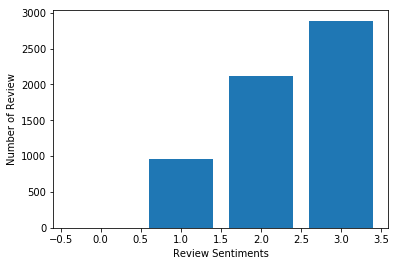

In [120]:
Sentiment_count=data.groupby('Sentiment').count()
plt.bar(Sentiment_count.index.values, Sentiment_count['Tweet'])
plt.xlabel('Review Sentiments')
plt.ylabel('Number of Review')
plt.show()

In [0]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import RegexpTokenizer
#tokenizer to remove unwanted elements from out data like symbols and numbers
token = RegexpTokenizer(r'[a-zA-Z0-9]+')
cv = CountVectorizer(lowercase=True,stop_words='english',ngram_range = (1,1),tokenizer = token.tokenize)
text_counts= cv.fit_transform(data['Tweet'])

Split train and test set
To understand model performance, dividing the dataset into a training set and a test set is a good strategy.

Let's split dataset by using function train_test_split(). You need to pass basically 3 parameters features, target, and test_set size. Additionally, you can use random_state to select records randomly.

 # Naive_Bayes

In [0]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    text_counts, data['Sentiment'], test_size=0.3, random_state=1)

Model Building and Evaluation
Let's build the Text Classification Model using TF-IDF.

First, import the MultinomialNB module and create a Multinomial Naive Bayes classifier object using MultinomialNB() function.

Then, fit your model on a train set using fit() and perform prediction on the test set using predict().

In [123]:
from sklearn.naive_bayes import MultinomialNB
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Generation Using Multinomial Naive Bayes
clf = MultinomialNB().fit(X_train, y_train)
predicted= clf.predict(X_test)
print("MultinomialNB Accuracy:",metrics.accuracy_score(y_test, predicted))

MultinomialNB Accuracy: 0.5689558905639308


Well, you got a classification rate of 56.89% using CountVector(or BoW), which is not considered as good accuracy. We need to improve this.

In [0]:
from sklearn.feature_extraction.text import TfidfVectorizer
tf=TfidfVectorizer()
text_tf= tf.fit_transform(data['Tweet'])

Feature Generation using TF-IDF
In Term Frequency(TF), you just count the number of words occurred in each document. The main issue with this Term Frequency is that it will give more weight to longer documents. Term frequency is basically the output of the BoW model.

In [125]:
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
# Model Generation Using Multinomial Naive Bayes
clf = MultinomialNB().fit(X_train, y_train)
predicted= clf.predict(X_test)
print("MultinomialNB Accuracy:",metrics.accuracy_score(y_test, predicted))

MultinomialNB Accuracy: 0.5689558905639308


Well, you got a classification rate of 56.89% using TF-IDF features, which is not considered as good accuracy. We need to improve the accuracy by using some other preprocessing or feature engineering. Let's suggest in comment box some approach for accuracy improvement.

# k-Nearest Neighbors

**k-Nearest Neighbors**: performance in practice and the train test split
 
It is all well and good to have a measure of performance such as accuracy, but if we fit the model on all of the data we have, what dataset are we going we going to report the accuracy from? Remember that we want a model that generalizes well to new data. Thus, if we train our model on a dataset D, reporting the accuracy of the model on the same data D may make it look as though it performs better than it actually does. This is known as overfitting. To combat this issue, data scientists will commonly train their model on a subset of the data, called the training set and evaluate its performance on the rest of the data, the test set. This is precisely what we're going to do here! A general rule of thumb is to use approximately 80% of the data for training & 20% for test. Let's now split our red wine quality data:

> Indented block



In [0]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    text_counts, data['Sentiment'], test_size=0.3, random_state=1)

We now build the k-NN model, make predictions on the test set and compare these predictions to the ground truth in order to get a measure of model performance:

In [138]:
from sklearn import neighbors, linear_model
knn = neighbors.KNeighborsClassifier(n_neighbors = 5)
knn_model_1 = knn.fit(X_train, y_train)
print('k-NN accuracy for test set: %f' % knn_model_1.score(X_test, y_test))

k-NN accuracy for test set: 0.461195


It is worth reiterating that the default scoring method for k-NN in scikit-learn is accuracy. An accuracy of 46% is not great but for an out of the box model without any preprocessing it's not horrible either. To check out a variety of other metrics, we can use scikit-learn's classification report also:

In [137]:
from sklearn.metrics import classification_report
y_true, y_pred = y_test, knn_model_1.predict(X_test)
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           1       0.17      0.10      0.13       285
           2       0.41      0.36      0.38       646
           3       0.54      0.65      0.59       860

    accuracy                           0.46      1791
   macro avg       0.37      0.37      0.37      1791
weighted avg       0.43      0.46      0.44      1791



# Lexicon-based using Bag Of Words

In [0]:
lex_file = open("AFINN-111.csv")

In [130]:
no_records = len(data)
print(no_records)

5968


In [136]:
word_list = []
print(word_list)
for  record in data['Tweet']:
    print("record")
    print(record)
    print("tokens")
    tokens = record.split()
    print(tokens)
    words = []
    for word in tokens:
        words.append(word.lower())
        print(words)
    
    word_list.append(words)
print("word_list")
print(word_list)


[]
record
Not Available
tokens
['Not', 'Available']
['not']
['not', 'available']
record
IOS  App Transport Security Mm need to check if my rd party network pod supports it httptcofmtcfUAdgj
tokens
['IOS', 'App', 'Transport', 'Security', 'Mm', 'need', 'to', 'check', 'if', 'my', 'rd', 'party', 'network', 'pod', 'supports', 'it', 'httptcofmtcfUAdgj']
['ios']
['ios', 'app']
['ios', 'app', 'transport']
['ios', 'app', 'transport', 'security']
['ios', 'app', 'transport', 'security', 'mm']
['ios', 'app', 'transport', 'security', 'mm', 'need']
['ios', 'app', 'transport', 'security', 'mm', 'need', 'to']
['ios', 'app', 'transport', 'security', 'mm', 'need', 'to', 'check']
['ios', 'app', 'transport', 'security', 'mm', 'need', 'to', 'check', 'if']
['ios', 'app', 'transport', 'security', 'mm', 'need', 'to', 'check', 'if', 'my']
['ios', 'app', 'transport', 'security', 'mm', 'need', 'to', 'check', 'if', 'my', 'rd']
['ios', 'app', 'transport', 'security', 'mm', 'need', 'to', 'check', 'if', 'my', 'rd', 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [142]:
#For each tweet
#For each word in tweet
#Get the word score (score is a numbe rif the word is in Lexicon, 0 if not)
#Add all the scores and find the ploarity
strength = []
for tweet in word_list:
    score = 0
    for word in tweet:
        if word in (lexicons):
            score = score + lexicons[word]
    strength.append(score)
print(strength)

[0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, -1, 0, 0, 0, 0, -2, 0, 1, 0, 0, 0, 2, 1, 0, 0, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 0, -1, 0, 0, 0, 0, -2, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, -4, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, -2, 2, 0, 5, 0, 0, -2, 0, 0, 0, 0, 0, 0, -4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 4, 0, 0, 1, 0, 0, -1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -2, 0, 0, 1, 4, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -3, 0, 0, 0, 0, -4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -2, 0, 0, 1, 0, 0, 0, 0, -2, 0, 0, 0, 0, -1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, -4, 1, 4, 1, 1, 0, 0, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

In [0]:
senti_matrix = pd.DataFrame(strength, data['Tweet'])

In [144]:
senti_matrix[0:]

,0
Tweet,
Not Available,0
IOS App Transport Security Mm need to check if my rd party network pod supports it httptcofmtcfUAdgj,2
Mar if you have an iOS device you should download our app too httptcogltnuDnD,0
jimmie_vanagon my phone does not run on latest IOS which may account for problem the other day time it was replaced,0
Not sure how to start your publication on iOS Well be live helping with ask me anything sessions today and Friday httptcoKPqqGjjhx,0
Two Dollar Tuesday is here with Forklift QuickKey for iOS and Suite for Pages for just today httptcoBNMFOEACw,0
If youre not already signed up to test my iOS game nows your chance httpstcoeZhIUEDpQ,0
YouTube Gaming Officially Launches On Web Android iOS On August YouTube is finally going to r httptcoqbhyAkaWP webseries,0
YouTube Gaming Launches Tomorrow with iOS and Android Apps to Go HeadtoHead with Twitch httptcoyZOATToeJC ios game,0


https://www.datacamp.com/community/tutorials/text-analytics-beginners-nltk